In [1]:
%load_ext autoreload
%autoreload 2

from substrata import *

# Set up logging to be verbose (INFO)
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger('unicorn')

/home/pbongaerts/miniconda3/envs/substrata/lib/python3.10/site-packages/tqdm_joblib/__init__.py:4: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [18]:
plot = initializer.ProjectInitializer(path='/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001')
plot.initialize()
#plot.orient()

INFO:substrata.pointclouds:Loading in pointcloud /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001/ton_ko2_60m_20241001_dec50M.ply...


Loading pointcloud from /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001/ton_ko2_60m_20241001_dec50M.ply
Loading cameras from /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001/ton_ko2_60m_20241001.meta.json and /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001/ton_ko2_60m_20241001.cams.xml
Loading markers from /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_60m/ton_ko2_60m_20241001/ton_ko2_60m_20241001_markers.csv


INFO:substrata.pointclouds:Applied transform:
[[0.22848204 0.         0.         0.        ]
 [0.         0.22848204 0.         0.        ]
 [0.         0.         0.22848204 0.        ]
 [0.         0.         0.         1.        ]]


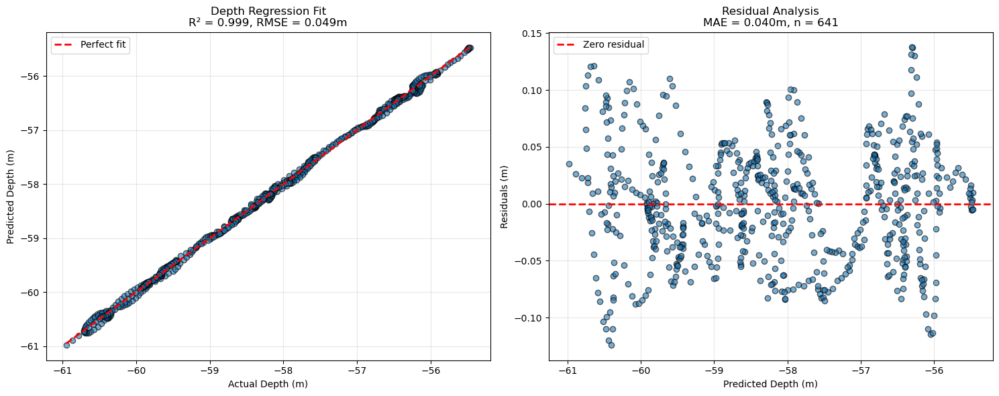


Regression Summary:
  Cameras used: 641
  R² score: 0.9989
  RMSE: 0.0494 m
  MAE: 0.0398 m
  Up vector (normalized): [-0.0123, -0.0471, 0.2507]
  Depth offset: -58.9134 m


In [19]:
plot.scalebars = Scalebars(RGL_SCALEBARS, plot.markers)
plot.pcd.apply_transform(Transform.from_scale(plot.scalebars.scalefactor))
up_vector, depth_offset, *_ = plot.cams.get_up_vector_from_camera_depths(plot=True)

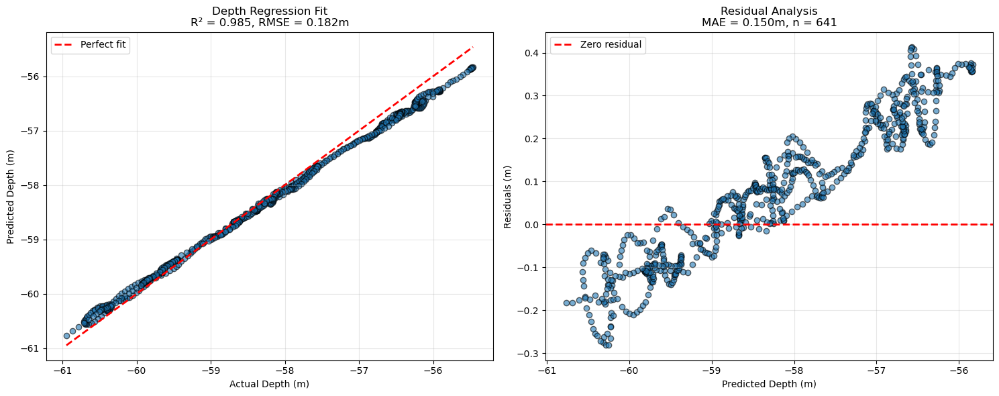


Regression Summary:
  Cameras used: 641
  R² score: 0.9852
  RMSE: 0.1820 m
  MAE: 0.1501 m


In [37]:
#plot.pcd.apply_transform(Transform.from_up_vector(up_vector),plot=True)
#plot.pcd.apply_transform(Transform.from_depth_offset(depth_offset), plot=True)
#plot.cams.apply_transform(plot.pcd.world_transform)
depths, z_coords = plot.cams.get_depths_and_z_coords()
fig = visualizations.plot_depth_regression(depths, z_coords)

In [33]:
print(depths)
print(z_coords)

[-55.462039479356, -55.482778982662, -55.494548612107, -55.502346958714, -55.498596095633, -55.497516827547, -55.491759741284, -55.484429373617, -55.479894059766, -55.474509340531, -55.492053228712, -55.515671545386, -55.546195029931, -55.59345937191, -55.636867347575, -55.685819550428, -55.729554151887, -55.765930391744, -55.808080425588, -55.869604288289, -55.934343081035, -56.009586748153, -56.106021535226, -56.186336068969, -56.268969873753, -56.334862612572, -56.401785793204, -56.46315791218, -56.504586618907, -56.550836789253, -56.594224016558, -56.629868958372, -56.666360856081, -56.682243519786, -56.691196334066, -56.694686278424, -56.679140849688, -59.274208952997, -59.189422415528, -59.090517783676, -58.995516442859, -58.902347946336, -58.803541859373, -58.710846723054, -58.622577659326, -58.529937637659, -58.441478080321, -58.355075421651, -58.249909028801, -58.159461897566, -58.073086641396, -57.994892164651, -57.919288123274, -57.854449753885, -57.785184464272, -57.7213613

INFO:substrata.logging:Decimating point cloud from 49999466 to 50000 points
INFO:substrata.logging:Decimating point cloud from 49999466 to 50000 points


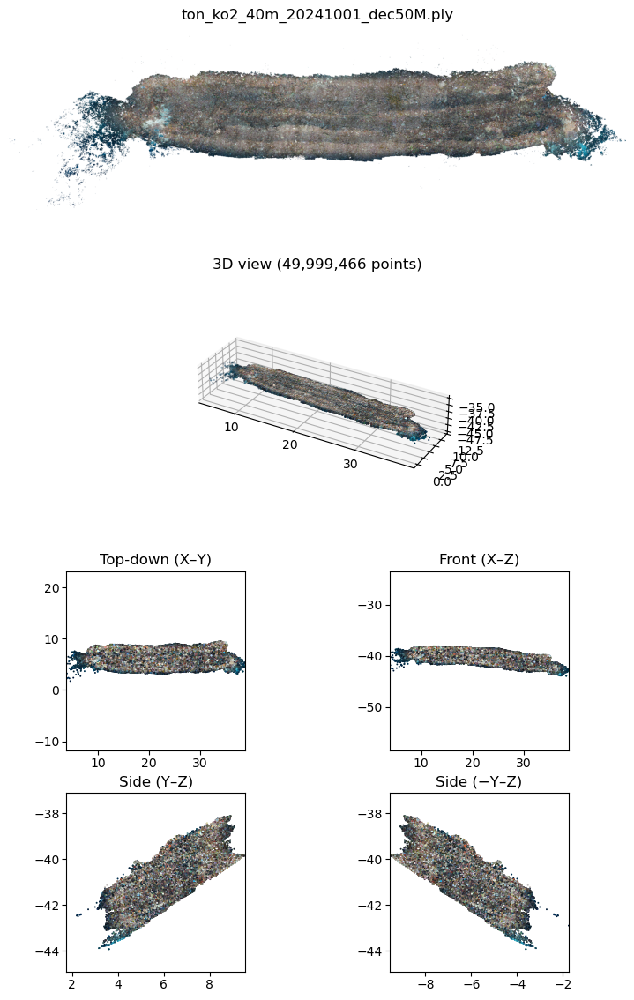

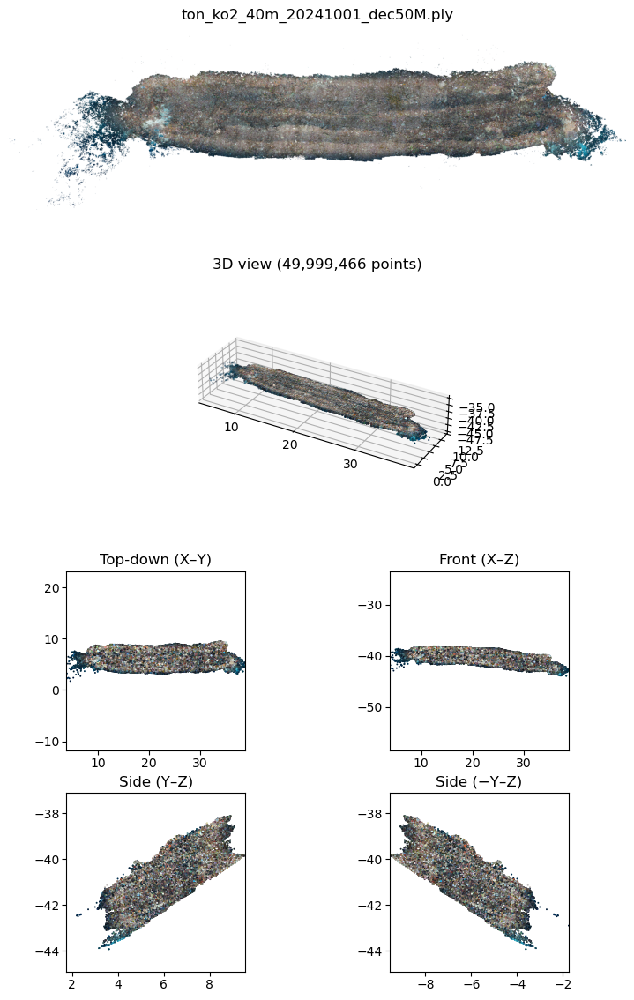

In [3]:
visualizations.plot_views(plot.pcd)

In [6]:
print(plot.scalebars)

Scalebars(
  num_scalebars=19,
  scalebar_1='target 3'-'target 4' (0.5m) [no_coords],
  scalebar_2='target 5'-'target 6' (0.5m) [no_coords],
  scalebar_3='target 7'-'target 8' (0.499m) [no_coords],
  scalebar_4='target 31'-'target 33' (0.2m) [partial_coords],
  scalebar_5='target 32'-'target 34' (0.2m) [dist=0.2041, residual=+0.0041],
  scalebar_6='target 31'-'target 32' (0.07m) [dist=0.0700, residual=+0.0000],
  scalebar_7='target 33'-'target 34' (0.07m) [partial_coords],
  scalebar_8='target 35'-'target 37' (0.2m) [dist=0.1996, residual=-0.0004],
  scalebar_9='target 36'-'target 38' (0.2m) [dist=0.1996, residual=-0.0004],
  scalebar_10='target 35'-'target 36' (0.07m) [dist=0.0698, residual=-0.0002],
  scalebar_11='target 37'-'target 38' (0.07m) [dist=0.0697, residual=-0.0003],
  scalebar_12='target 39'-'target 41' (0.2m) [dist=0.2000, residual=-0.0000],
  scalebar_13='target 40'-'target 42' (0.2m) [dist=0.2000, residual=-0.0000],
  scalebar_14='target 39'-'target 40' (0.07m) [dist=0.

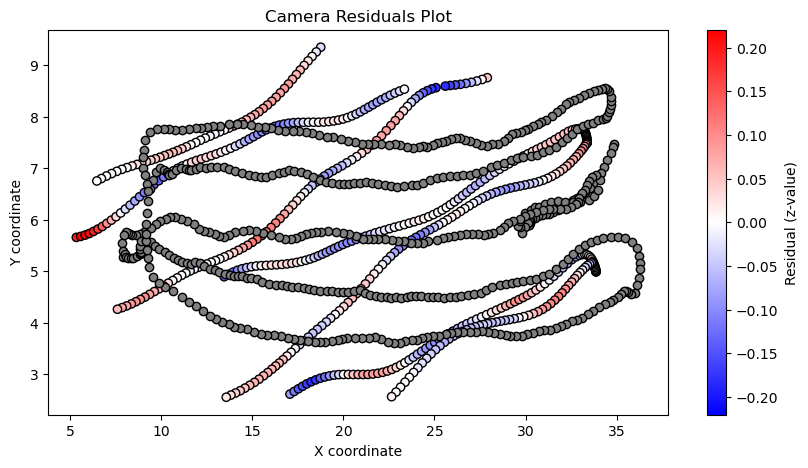

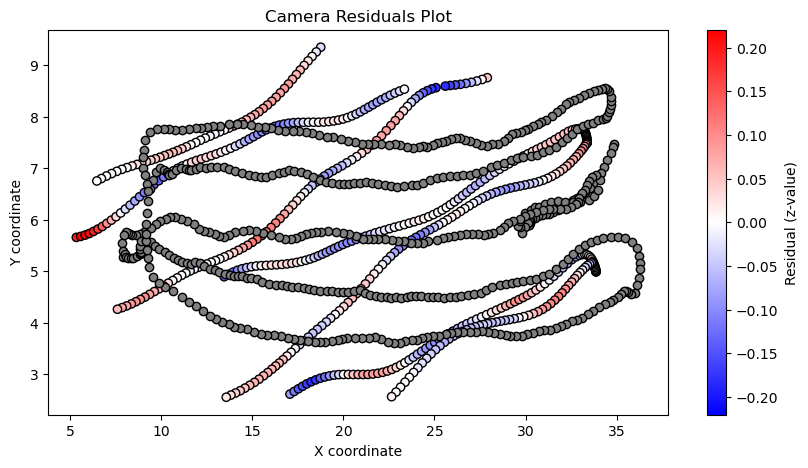

In [8]:
visualizations.show_cam_residuals(plot.cams)

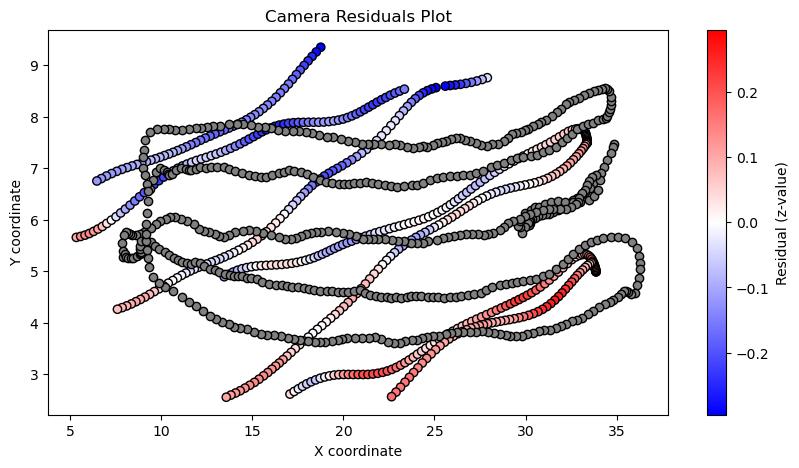

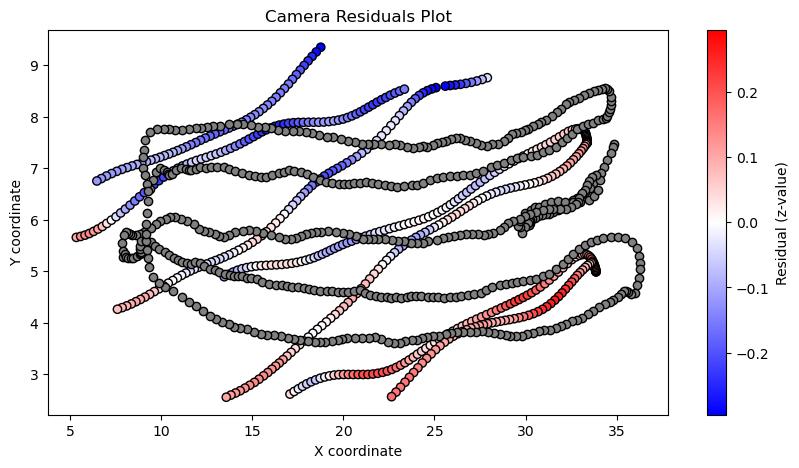

In [10]:
for cam in plot.cams.data.values():
    if hasattr(cam, 'depth') and cam.depth is not None:
        cam.depth_residual = cam.depth - cam.coords[2]
visualizations.show_cam_residuals(plot.cams)

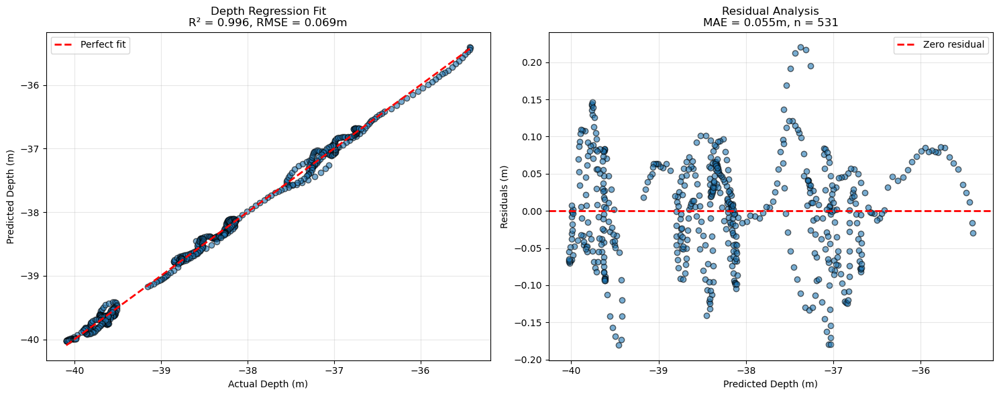


Regression Summary:
  Cameras used: 531
  R² score: 0.9964
  RMSE: 0.0689 m
  MAE: 0.0554 m
  Up vector (normalized): [0.0683, 0.0992, 0.1647]
  Depth offset: -38.2671 m


(array([0.06825792, 0.09921531, 0.164749  ]),
 np.float64(-38.26711938302041),
 0.00475235207076005,
 np.float64(0.06893730536335207),
 0.05544459485964933,
 0.9964259595197995,
 {'537': np.float64(-0.029605562318245404),
  '538': np.float64(-0.016252729826391032),
  '539': np.float64(0.011833888137047666),
  '540': np.float64(0.024082747571796403),
  '541': np.float64(0.035221313932090936),
  '542': np.float64(0.0563865894758635),
  '543': np.float64(0.06447216732210848),
  '544': np.float64(0.07279398403803583),
  '545': np.float64(0.08489000026374072),
  '546': np.float64(0.08625813161405915),
  '547': np.float64(0.07845010190354884),
  '548': np.float64(0.07918367529676829),
  '549': np.float64(0.08155102545610049),
  '550': np.float64(0.07930880995935041),
  '551': np.float64(0.08477008847927436),
  '552': np.float64(0.08039302466731613),
  '553': np.float64(0.07354402730464926),
  '554': np.float64(0.06612906434581589),
  '555': np.float64(0.055018114377773486),
  '556': np.float

In [8]:
plot.cams.get_up_vector_from_camera_depths(plot=True)

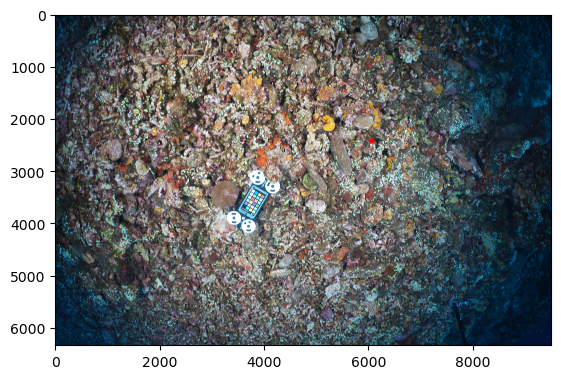

In [29]:
visualizations.show_img_cv2(plot.cams["530"].filepath, highlight_pixels=[6072, 2431])

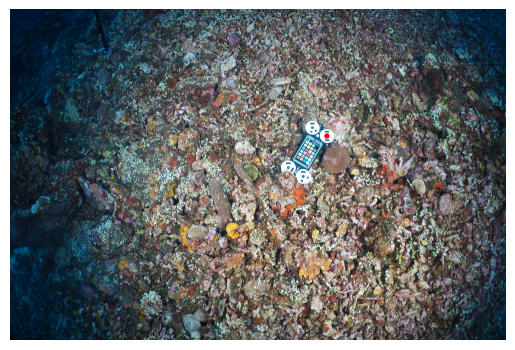

In [30]:
visualizations.show_img(plot.cams["530"].filepath, highlight_pixels=[6072, 2431])

INFO:substrata.pointclouds:Building kdtree for /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001_dec50M.ply...


target 31 [ 26.84874876  31.95727257 -32.03011153] [  8.62156934   7.92920083 -38.56612834]
/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05775.JPG
Image match for camera 530 at 6072, 2431
Depth: 4.30896482723341, Relevance: 0.0025495922266806506
Obstructed: False
Reprojection error: 0.003753516103984417
Reprojection coords: [  8.62461879   7.92701698 -38.56627175]


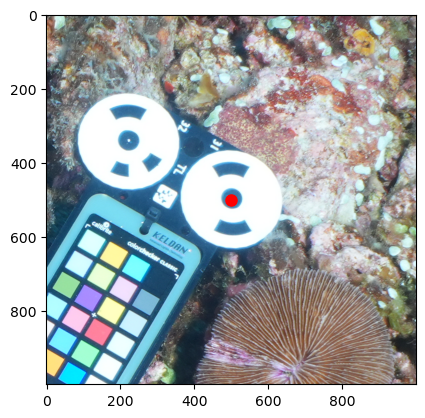

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05774.JPG
Image match for camera 529 at 4943, 741
Depth: 4.2782795125254545, Relevance: 0.0036901481996821574
Obstructed: False
Reprojection error: 0.003753516103984417
Reprojection coords: [  8.62461879   7.92701698 -38.56627175]


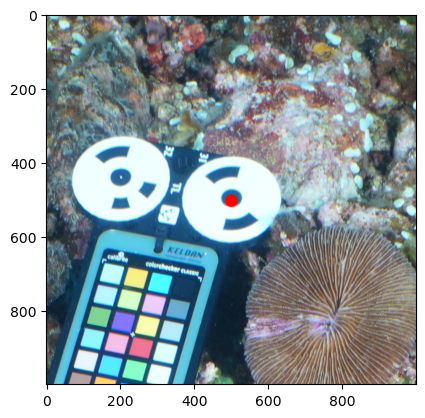

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05776.JPG
Image match for camera 531 at 7413, 4439
Depth: 3.7743057207734267, Relevance: 0.0049286789901084
Obstructed: False
Reprojection error: 0.003753516103984417
Reprojection coords: [  8.62461879   7.92701698 -38.56627175]


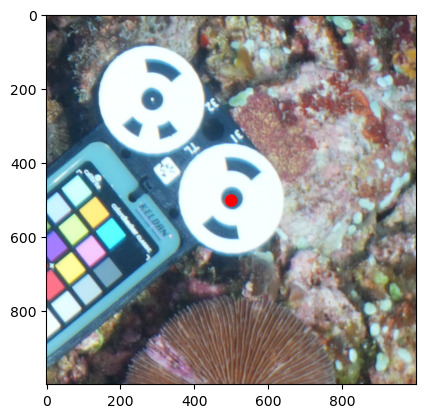

target 32 [ 26.56275585  32.05660681 -32.11378763] [  8.61081295   7.86490795 -38.59175401]
/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05775.JPG
Image match for camera 530 at 5794, 2274
Depth: 4.367095060801123, Relevance: 0.002419822157517585
Obstructed: False
Reprojection error: 0.0018973345390949936
Reprojection coords: [  8.61062136   7.86582121 -38.59010201]


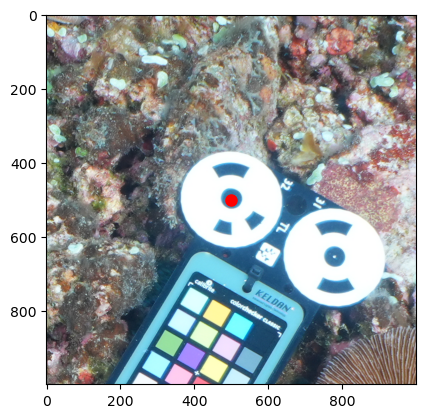

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05774.JPG
Image match for camera 529 at 4644, 686
Depth: 4.307277293206631, Relevance: 0.0037362629157904437
Obstructed: False
Reprojection error: 0.0036902883893378943
Reprojection coords: [  8.61427623   7.86589439 -38.59094728]


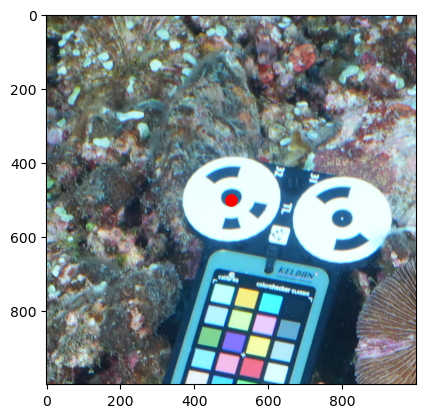

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05776.JPG
Image match for camera 531 at 7198, 4170
Depth: 3.891568826876398, Relevance: 0.004273059738820009
Obstructed: False
Reprojection error: 0.0018973345390949936
Reprojection coords: [  8.61062136   7.86582121 -38.59010201]


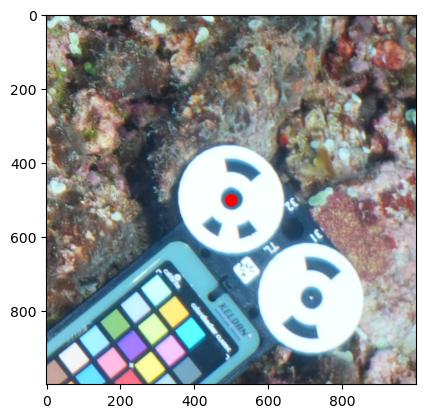

target 34 [ 26.16452004  31.32487713 -31.73430865] [  8.80936423   7.8406073  -38.63247161]
/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05775.JPG
Image match for camera 530 at 5288, 3029
Depth: 4.270220371226046, Relevance: 0.0007714052269816661
Obstructed: False
Reprojection error: 0.0057064756884277375
Reprojection coords: [  8.80722991   7.84580825 -38.63345071]


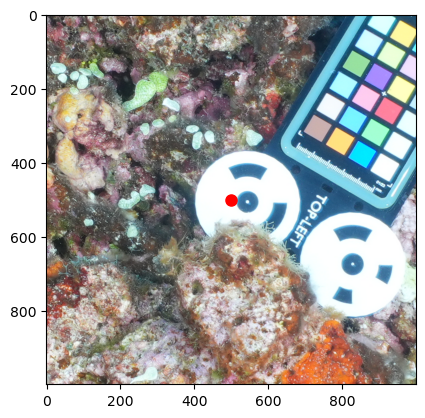

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05776.JPG
Image match for camera 531 at 6415, 4752
Depth: 3.8578074452339877, Relevance: 0.0037154564356654987
Obstructed: False
Reprojection error: 0.0057064756884277375
Reprojection coords: [  8.80722991   7.84580825 -38.63345071]


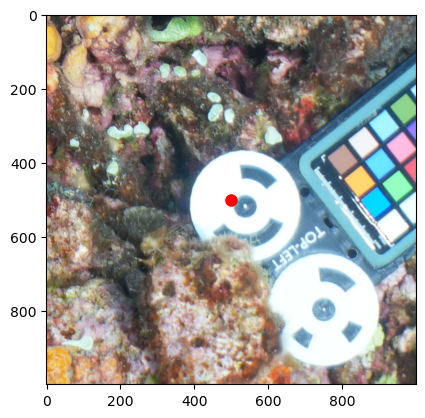

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05604.JPG
Image match for camera 359 at 354, 3526
Depth: 3.634337945694842, Relevance: 0.008997150852246064
Obstructed: False
Reprojection error: 0.0057064756884277375
Reprojection coords: [  8.80722991   7.84580825 -38.63345071]


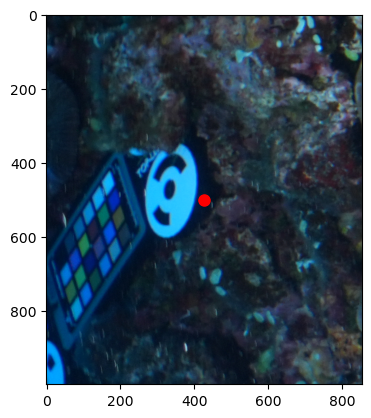

target 35 [ 11.36432779  29.28934145 -34.83373185] [  9.64647334   5.13300508 -40.51501718]
/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05593.JPG
Image match for camera 348 at 4521, 2396
Depth: 4.063323658329789, Relevance: 0.0010550528131645785
Obstructed: False
Reprojection error: 0.007209708284019979
Reprojection coords: [  9.64808656   5.12972542 -40.50880258]


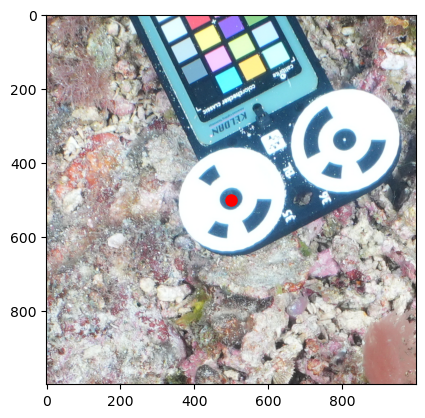

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05594.JPG
Image match for camera 349 at 4718, 4639
Depth: 4.071026984720618, Relevance: 0.0016927422976127859
Obstructed: False
Reprojection error: 0.007103431803694888
Reprojection coords: [  9.64732745   5.12933159 -40.50899765]


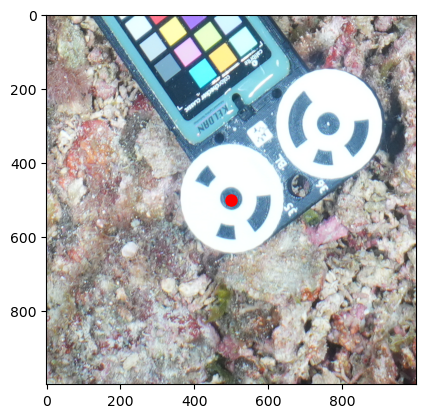

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05592.JPG
Image match for camera 347 at 4540, 447
Depth: 3.9339833787847525, Relevance: 0.0037620309108874544
Obstructed: False
Reprojection error: 0.007209708284019979
Reprojection coords: [  9.64808656   5.12972542 -40.50880258]


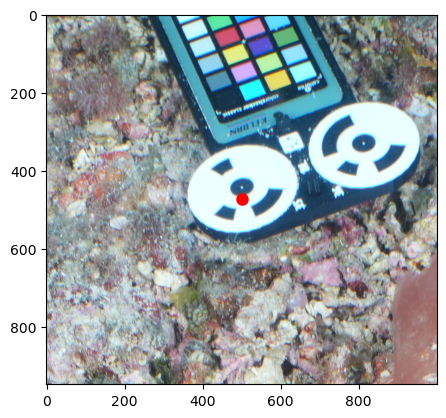

target 36 [ 11.67190066  29.29590675 -34.77503311] [  9.63449636   5.19269685 -40.48079745]
/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05593.JPG
Image match for camera 348 at 4828, 2237
Depth: 4.034957402768601, Relevance: 0.0010548146718713253
Obstructed: False
Reprojection error: 0.007397458560775537
Reprojection coords: [  9.6346344    5.18811238 -40.47499349]


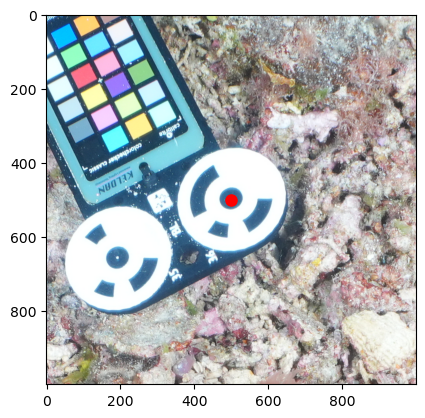

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05594.JPG
Image match for camera 349 at 4981, 4437
Depth: 4.051516444248104, Relevance: 0.0016349379755991624
Obstructed: False
Reprojection error: 0.007397458560775537
Reprojection coords: [  9.6346344    5.18811238 -40.47499349]


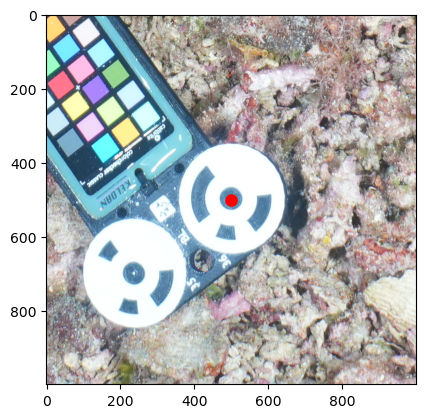

/mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001.photos/PGRAM01_100MSDCF_DSC05592.JPG
Image match for camera 347 at 4851, 336
Depth: 3.9149181247540774, Relevance: 0.0038093059164457338
Obstructed: False
Reprojection error: 0.004124469997070841
Reprojection coords: [  9.63775083   5.19208198 -40.47833948]


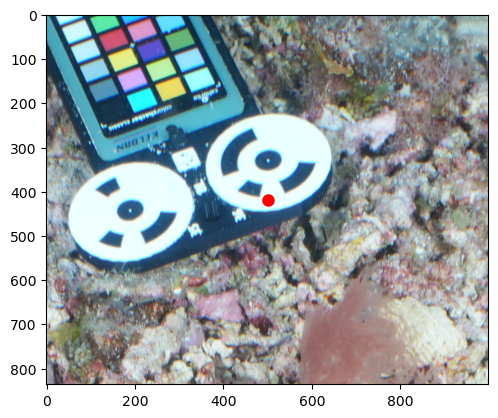

In [5]:
for marker in plot.markers.subset(5):
    print(marker.label, marker.orig_coords, marker.coords)
    matches = marker.get_image_matches(plot.cams, max_cams=3, pcd=plot.pcd)
    for match in matches: 
        print(match.filepath)
        try:
            match.show()
        except Exception as e:
            print(f"Error showing match: {e}")


INFO:substrata.logging:Decimating point cloud from 49999466 to 50000 points


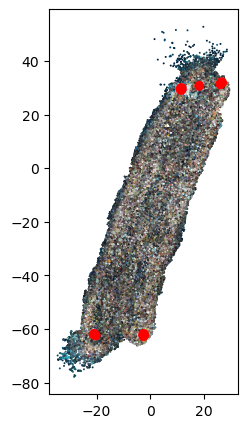

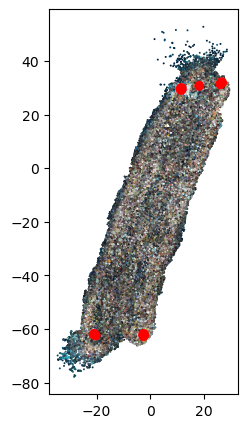

In [18]:
visualizations.plot_2d(plot.pcd, highlight_coords=plot.markers.coords)

INFO:substrata.pointclouds:Building kdtree for /mnt/sdd/tonga_focal/ton_ko2/ton_ko2_40m/ton_ko2_40m_20241001/ton_ko2_40m_20241001_dec50M.ply...


Number of scalebars: 12
Scale factor: 0.22299
Variance: 0.0000020714
Std Error: 0.0004154734


/home/pbongaerts/Github/substrata/src/substrata/visualizations.py:166: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(width, height))
/home/pbongaerts/Github/substrata/src/substrata/annotations.py:1146: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


[<Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>,
 <Figure size 400x400 with 1 Axes>]

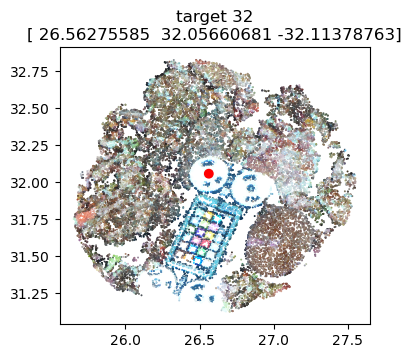

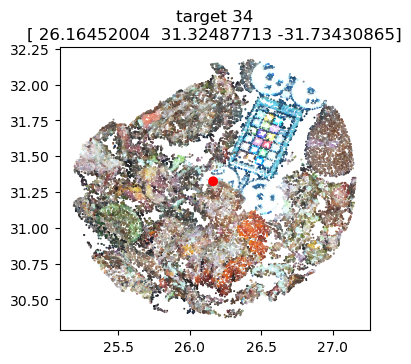

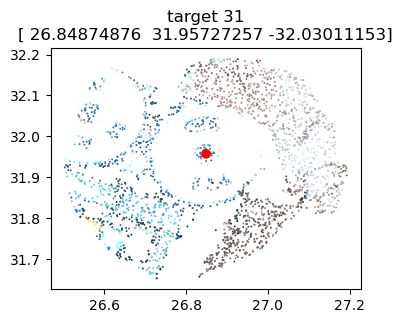

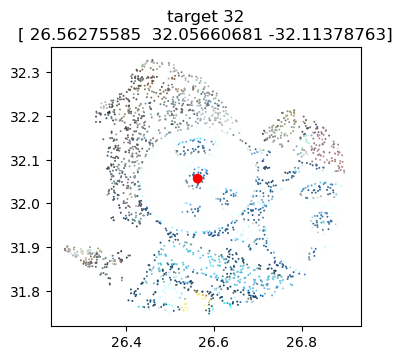

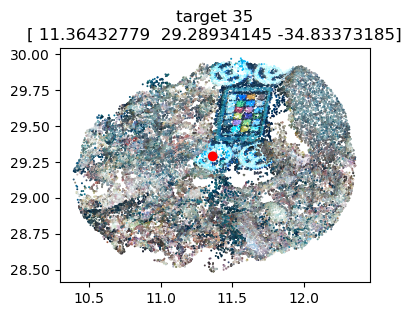

...

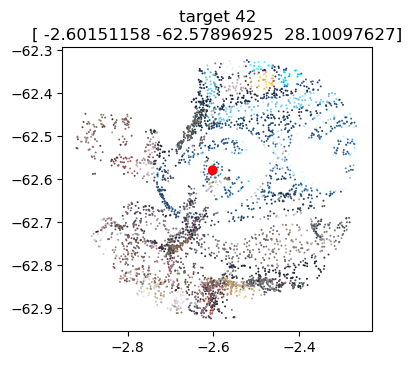

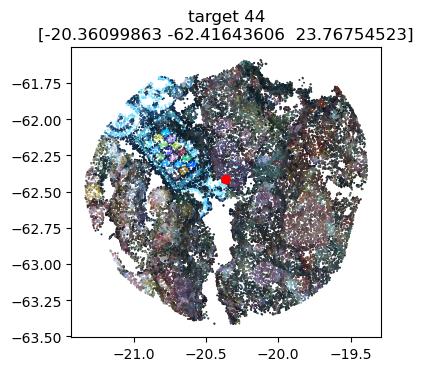

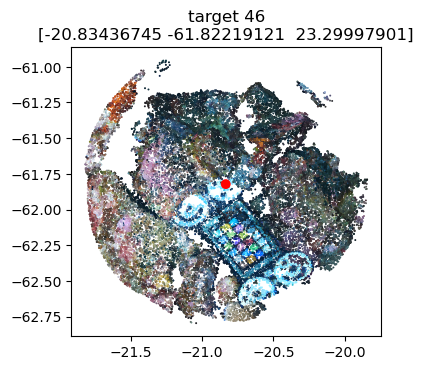

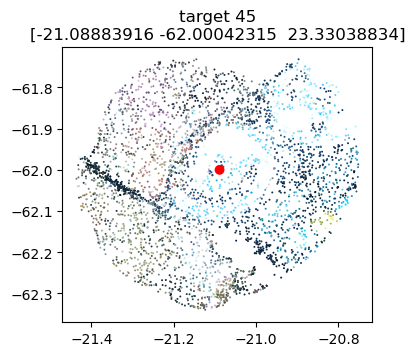

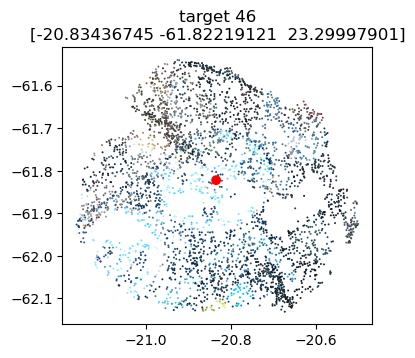

In [7]:
plot.scalebars = Scalebars(RGL_SCALEBARS, plot.markers)
plot.scalebars.show(plot.pcd)